# *Audio features used in Machine & Deep Learning* 

## 1. Loading Data & developing the necessary theorerical tools

### 1.1. Importing libraries and reading the sample wav files

In [1]:
import librosa
import os
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

In [7]:
import glob

wav_paths = list(glob.glob(os.path.join("wavs", "*.wav")))
audio = []
for wav in wav_paths:
    audio.append(librosa.load(wav,)[0])

In [11]:
ipd.Audio(wav_paths[0]) # sample 1

In [12]:
ipd.Audio(wav_paths[1]) # sample 2

In [14]:
ipd.Audio(wav_paths[2]) # sample 3

In [15]:
ipd.Audio(wav_paths[3]) # sample 4

#### 1.2. It all starts with the waveform!

In general, an analog signal can be represented as a function of time, i.e. we can think of a signal as real valued function $f:[0,\infty)\to \mathbb{R}$, where the independent variable $t\geq 0$ represents the time and the corresponding value $f(t)$ the amplitude of the signal at time $t$. By amplitude we mean air deviation pressure from the average air pressure at a certain location at time $t$. 

Since it is impossible to store an infinetely many points on computer machines we perform a sampling on the axis correspoding to time and we consider a digital representation of the continuous signal. To be more precise, we fix a real number $T>0$ corresponding to the *sampling period* and by starting at time $0$ we sample a point from the continuous signal at each integer multiple of $T$. The reciprocal $1/T$ is called the sampling rate and it is denoted by $F_s$. $F_s$ corresponds to the number of sample points collected in a one second time interval. In librosa, the default value is $F_s = 22050$ Hz.

Therefore, the continuous signal $f(t)$ can now be represented by a sequence $x:\mathbb{N}_{\geq 0}\to \mathbb{R}$ such that $x(n) = f(n\cdot T)$. Below, using librosa and matplotlib we can visualize the graph of the sequence $x(n)$ for each of the four samples.

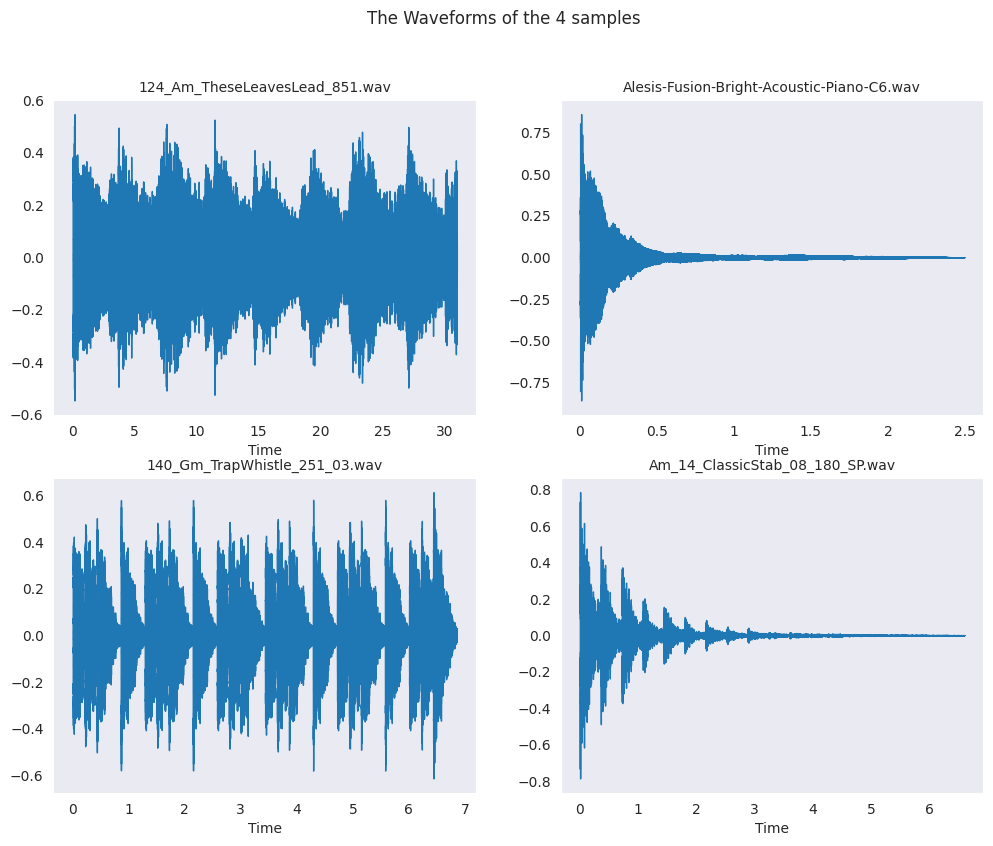

In [29]:
import seaborn as sns
import librosa.display
sns.set_style("dark")

fig, ax = plt.subplots(figsize = (12,9), nrows = 2, ncols = 2)
Fs = 22050 # the default sampling rate of librosa
for i,sample in enumerate(audio):
    r,c = divmod(i,2)
    if r == 0:
        librosa.display.waveshow(y = sample, sr = Fs, ax = ax[r,c])
    else:
        librosa.display.waveshow(y = sample, sr = Fs, ax = ax[r,c])
    ax[r,c].set_title(os.path.basename(os.path.normpath(wav_paths[i])), fontsize = 10)
plt.suptitle("The Waveforms of the 4 samples",fontsize = 12)
plt.show()
    

#### 1.3. The spectral representation of a signal

A signal can be expressed as a superposition of periodic sinusoid signals of the form $t\mapsto A\cdot\sin\left((2\pi(\omega t - \phi))\right)$. The parameter $\omega$ is the frequency of the sine signal and corresponds to the number of oscillations the signal experiences in a one second time interval. It is measured in Hertz (Hz). The parameter $\phi$ is the phase of the signal. The parameter $A$ corresponds to the amplitude of the sinusoid signal. In the figure below we see four sinusoid signals for various frequencies, phases and amplitudes. 

In [35]:
import math
def sin_wave(t, w = 2.0, phi = 0.0, A = 1.0):
    return A*np.sin(2*np.pi*(w*t-phi))

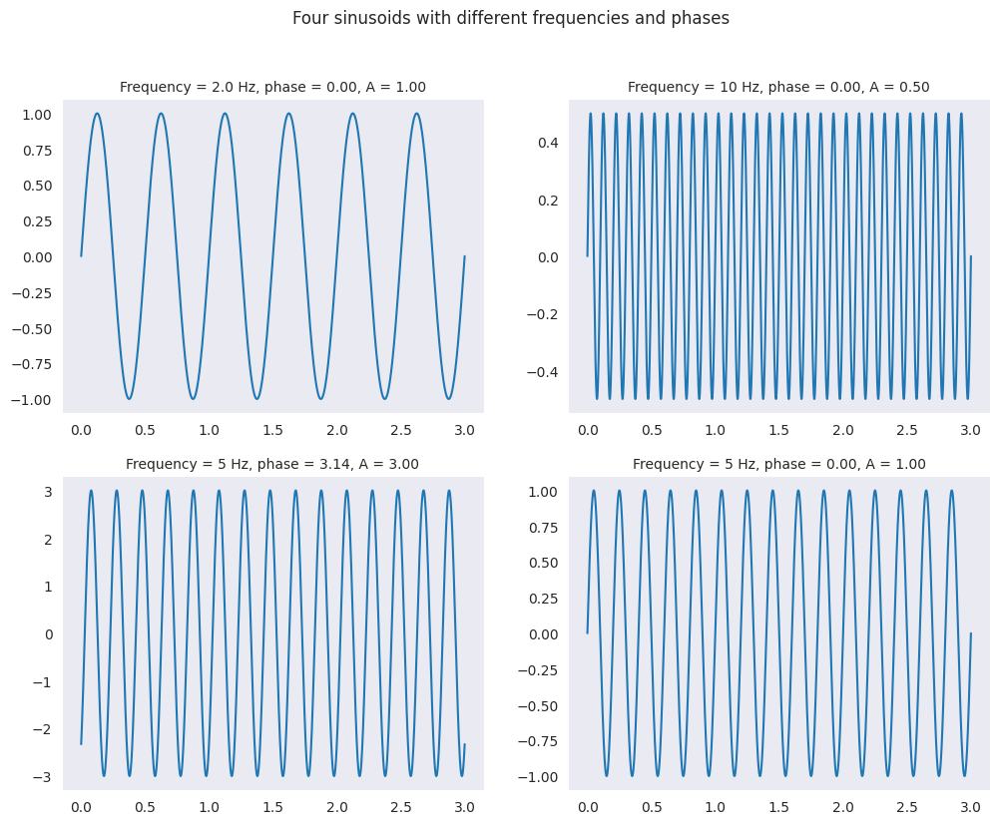

In [37]:
fig, ax = plt.subplots(figsize = (12, 9), nrows = 2, ncols =2)
t = np.linspace(start = 0, stop = 3, num = 30000)
params = [(2.0, 0.0, 1.0), (10, 0.0, 0.5), (5, np.pi, 3.0), (5, 0.0, 1.0)] # (w,phi, A)

for i, (w,phi, A) in enumerate(params):
    r,c = divmod(i,2)
    ax[r,c].plot(t, sin_wave(t, w = w, phi = phi, A = A))
    ax[r,c].set_title(f"Frequency = {w} Hz, phase = {phi:.2f}, A = {A:.2f}",fontsize = 10)
plt.suptitle("Four sinusoids with different frequencies and phases", fontsize = 12)
plt.show()

Below we see the sum of these four signals.

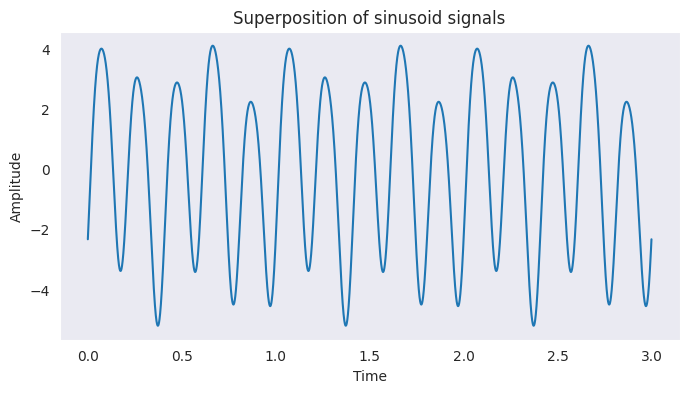

In [41]:
fig,ax = plt.subplots(figsize = (8,4))
sup_sin = np.zeros(shape = len(t))
for (w,phi,A) in params:
    sup_sin += sin_wave(t, w = w, phi = phi, A = A)
ax.plot(t, sup_sin)
ax.set_title("Superposition of sinusoid signals", fontsize = 12)
ax.set_xlabel("Time")
ax.set_ylabel("Amplitude")
plt.show()

#### 1.4. A short introduction to the Fourier transform

##### 1.4.1. The Continuous Fourier Transform

Now, our goal is to decompose a signal into its sinusoid parts. This decomposition is the spectral representation of the signal and consists of the transition from the time domain and time representation of the signal to the frequency domain and the spectral representation of the signal. This transition is handled by the *Fourier transform*. In general, for an analog signal $f:\mathbb{R}\to \mathbb{R}$ the Fourier transform of the signal is the function $\mathcal{F}:\mathbb{R}\to \mathbb{C}$ given by
<br>
$$\tag{1.4.1}\hat{f}(s) = \int_{-\infty}^{\infty}f(t)\cdot e^{-2\pi i st}\,dt,\quad s\in \mathbb{R}.$$
Of course, a lot of discussion can be done to whether (1.4.1) is well defined and for which functions $f$ we can consider their Fourier transforms. To formalize (1.4.1) in its full generality one needs to use tools from measure theory, a vast field of pure mathematics that requires a lot of hours to develop. Since we are about discretize (1.4.1) we will not bother with matters of convergence of the integral in (1.4.1).  

Now, in a loose way, we can say that (1.3.1) tries to measure the contribution of the frequency $s$ to the analog signal $f$. Observe that (1.4.1) defines a complex valued function, hence, to measure the overall contribution of the frequency $s$ to the signal we consider the magnitude of the complex number $\hat{f}(s)$ given by
<br>
$$\tag{1.4.2} \left|\hat{f}(s)\right| = \sqrt{\left(\text{Re}\left(\hat{f}(s)\right)\right)^2 + \left(\text{Im}\left(\hat{f}(s)\right)\right)^2}.$$

The higher the value of $\left|\hat{f}(s)\right|$ the higher the contribution of the frequency $s$ to the analog signal $f$. The graph of the function $s\mapsto \left|\hat{f}(s)\right|$ corresponds to the magnitude spectrum representation of the signal.

##### 1.4.2. The Discrete Fourier Transform (DFT)

Now, since our computer machines stores only digital signals, in order to obtain the spectral representation of a digital signal we must consider a discrete analog of (1.4.1). For this we proceed as follows: Suppose that we have an analog signal $f:[0,\infty) \to \mathbb{R}$ varying through time, then by using the sampling procedure described above, we obtain a digital representation $x:\mathbb{N}_{\geq 0}\to \mathbb{R}$ satisfying $x(n) = f(n\cdot T)$, where $T$ is the sampling period. Then, we can approximate (1.4.1) using the notion of the Riemman sum, i.e.

$$\tag{1.4.3}T\cdot \sum_{n\in \mathbb{Z}}x(n)\cdot e^{-2\pi i s nT} = T\cdot \sum_{n\in \mathbb{Z}}f(nT)\cdot e^{-2\pi i s nT}\approx \hat{f}(s).$$

In general, for a Discrete Time (DT) signal $x:\mathbb{N}_{\geq 0}\to \mathbb{R}$ the Fourier tranform is given by
<br>

$$\tag{1.4.4} \hat{x}(s) = \sum_{n\in \mathbb{Z}}x(n)\cdot e^{-2\pi i n s},\quad s\in \mathbb{R}$$

In this definiton, where a simple 1-sampling (i.e., T-sampling with T=1) of the exponential function is used, one does not assume that one knows the relation between
x and the original signal $f$. If one is interested in recovering the relation to the Fourier transform $\mathcal{F}$, one needs to know the sampling period T.

Now, the problem with (1.4.4) is that again involves an infinite process, since it requires to calculate an infinite sum and, the calculation must be repeated for a every real number $s$. In practice, we consider two discretizations, one with respect to the time domain and one with respect to the frequency domain. For the first case, we assume that signal lasts only for a finite period of time and we consider $N$ number of samples. In this way, the signal can be respresented by the points $x(0),\,x(1),\dots ,x(N-1).$ The discretization with respect to the frequency domain is called *quantization*. In practice, one considers the frequencies $k/N$ for each $k=0,\dots N-1$. Therefore, the Discrete Fourier transform of the DT signal $x$ is described by the finite sequence $\left(X(k)\right)_{k=0}^{N-1}$, where

$$\tag{1.4.5}X(k)= \hat{x}(k/N) = \sum_{n=0}^{N-1}x(n)\cdot e^{-2\pi i \frac{kn}{N}},\quad k=0,\dots, N-1.$$

By using (1.4.3) and (1.4.4) we see that the $\hat{x}(s)\approx  \frac{1}{T}\cdot \hat{f}\left(\frac{s}{T}\right)$. Therefore, the $k$-th Fourier coefficient $X(k)$ of the digital signal corresponds to the overall contribution of the frequency $k/NT = k\cdot F_s/N$ in the original analog signal $f$.

Below, we extract the Discrete Fourier Transform (DFT) for each of the four audio samples.

In [46]:
ffts = []
for sample in audio:
    ffts.append(np.fft.fft(sample))

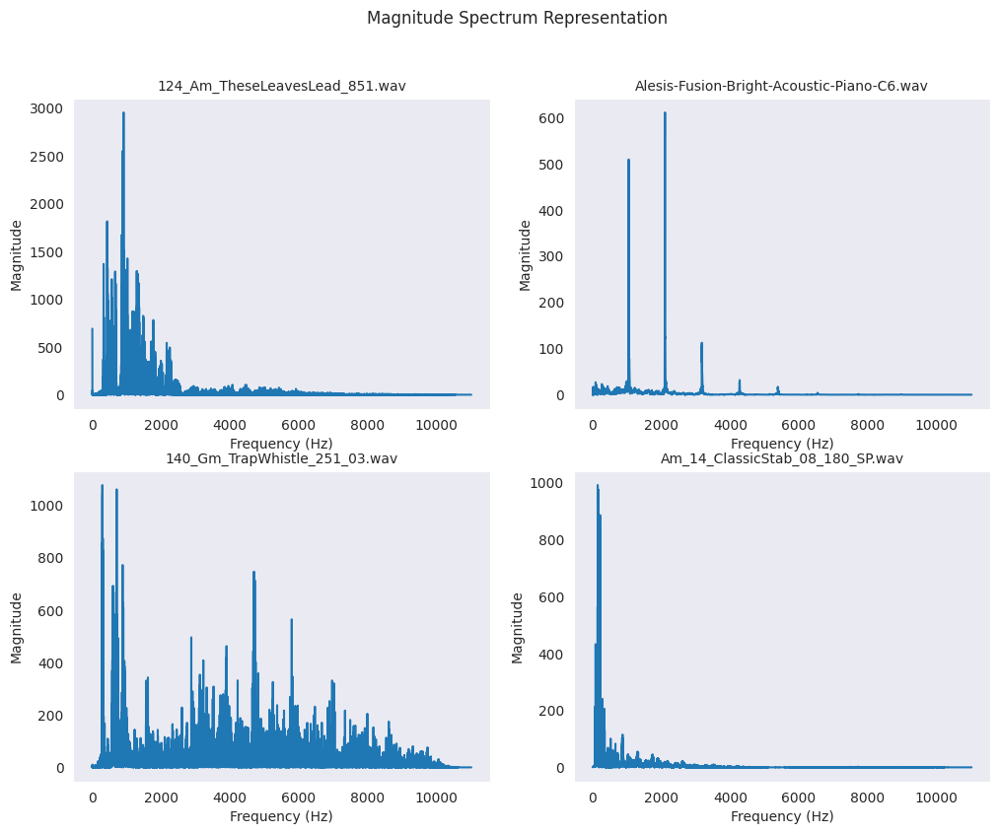

In [53]:
fig, ax = plt.subplots(figsize = (12, 9), nrows = 2, ncols = 2)
for i,fft in enumerate(ffts):
    r,c = divmod(i,2)
    freqs = np.linspace(0, Fs, len(fft))
    num_freq_bins = int(len(freqs)*1/2)
    ax[r,c].plot(freqs[:num_freq_bins], np.abs(fft[:num_freq_bins]))
    ax[r,c].set_xlabel("Frequency (Hz)")
    ax[r,c].set_ylabel("Magnitude")
    ax[r,c].set_title(os.path.basename(os.path.normpath(wav_paths[i])), fontsize = 10)
plt.suptitle("Magnitude Spectrum Representation", fontsize = 12)
plt.show()

##### 1.4.3. The Short-Time Fourier Transform

The Fourier transform yields frequency information that is averaged over the entire time domain. However, the information on when these frequencies occur is hidden in the transform. To recover the hidden time information, Dennis Gabor introduced in the year 1946 the short-time Fourier transform (STFT). Instead of considering the entire signal, the main idea of the STFT is to consider only a small section of the signal. To this end, one fixes a so-called window function, which is a function that is nonzero for only a short period of time (defining the considered section). The original signal is then multiplied with the window function to yield a windowed signal. To obtain frequency information at different time instances, one shifts the window function across time and computes a Fourier transform for each of the resulting windowed signals.

Formalizing the above description, suppose that $x:\mathbb{Z}\to \mathbb{R}$ is the real-valued DT-signal obtained by equidistant sampling with respect to a fixed sampling rate $F_s$ given in Hertz. Furthermore, let $w : [0,N-1]\to \mathbb{R}$ be a sampled window function of length $N$. One of the most frequently used window functions is the Hann window given by

$$\tag{1.4.6} w(k) = \frac{1}{2}\cdot \left(1- \cos\left(\frac{2\pi k}{N-1}\right)\right),\quad k =1,\dots, N.$$

Below you can see the graph of Hann window for window length size $N=1000$.

In [54]:
def hann_window(values, N = 1000):
    return (1/2)*(1-np.cos((2*np.pi*values)/(N-1)))

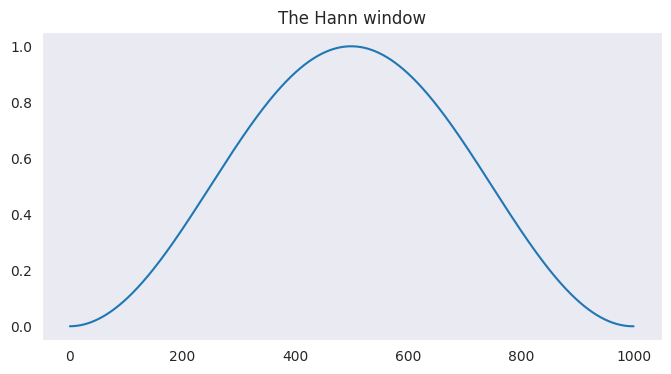

In [55]:
fig, ax = plt.subplots(figsize = (8,4))
values = np.arange(start = 1, stop = 1001)
ax.plot(values,hann_window(values))
ax.set_title("The Hann window",fontsize = 12)
plt.show()

Continuing from where we left off :p, we see that the length parameter $N$ determines the duration of the considered sections, which amounts to $N\cdot T$ seconds. One also introduces an additional parameter $H\in \mathbb{N}$, which is referred to as the *hop size*. The hop size parameter is specified in samples and determines the step size in which the window is to be shifted across the signal. With regard to these parameters, the discrete STFT $\mathcal{X}$ of the signal $x$ is given by

$$\tag{1.4.7} \mathcal{X}(m,k) = \sum_{n=0}^{N-1}x(n+mH)w(n)e^{-2\pi i kn/N},$$

with $m\in \mathbb{Z}$ and $k\in [0,K]$, where $K = N/2$ is the frequency index corresponding to the Nyquist frequency. The complex number $\mathcal{X}(m,k)$ denoted the $k$-th Fourier coefficient for the $m$-th time frame. Using Librosa we can extract the STFTs for each of the four audio samples.

In [65]:
FRAME_SIZE = 1024
HOP_SIZE = 512
stfts = []
for sample in audio:
    stfts.append(librosa.stft(y = sample, n_fft= FRAME_SIZE, hop_length = HOP_SIZE, win_length= FRAME_SIZE))

In [66]:
print(stfts[0].shape)

(513, 1334)


## 2. Audio Features

### 2.1. The Spectrogram

Now, what we have achieved so far with the *Short-Time Fourier Transform* in (1.4.7) is that we have encapsulated about the frequency and its time evolution at the same time. This information is represented by the two - dimensional complex matrix $\mathcal{X}$ defined in (1.4.7). The element $\mathcal{X}(k,m)$ corresponds to the $k$-th Fourier coefficient of the analog signal at frame-time $m$. Now, given the matrix $\mathcal{X}$ we can define the *spectrogram*, one of the most important audio features used in machine & deep learning frameworks. To this end, the spectrogram is the two - dimensional real matrix $\mathcal{Y}$ give by $\mathcal{Y}(k,m)=\left|\mathcal{X}(k,m)\right|^2.$  Using Librosa we can visualize the spectrogram for each of the four audio samples as a 2D - image.

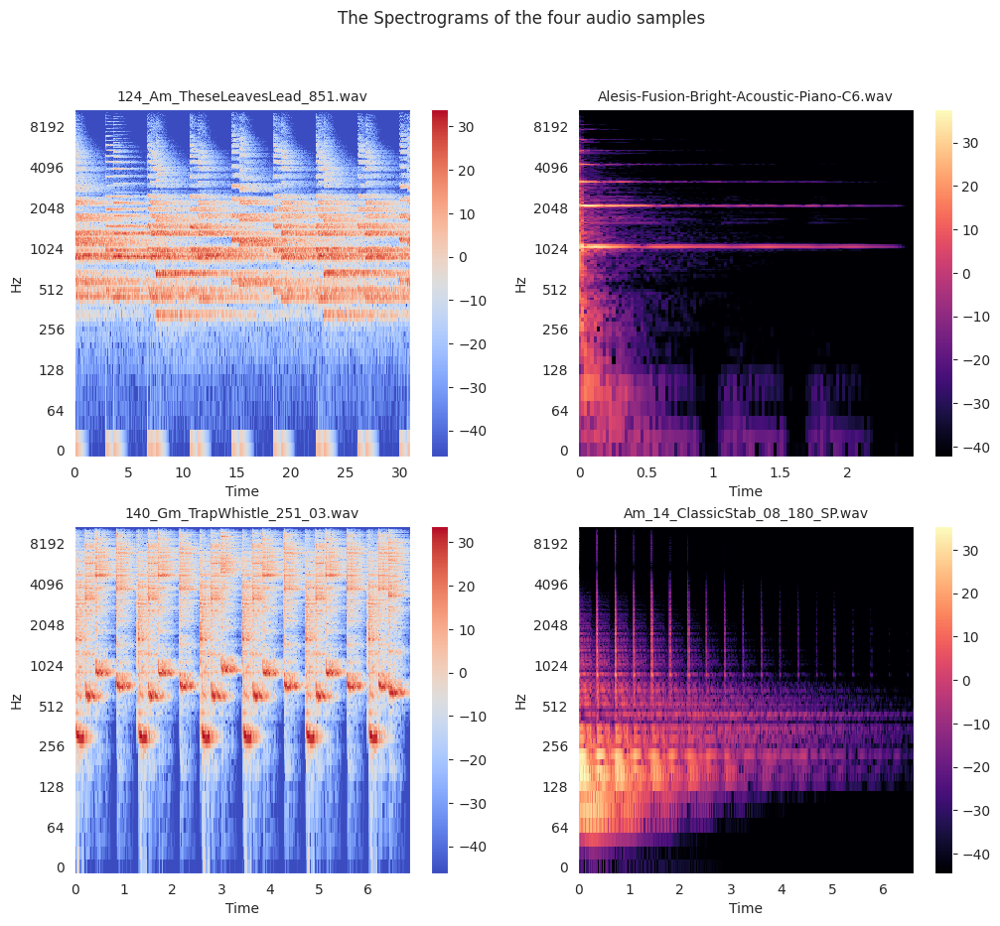

In [77]:
fig, ax = plt.subplots(figsize = (12,10), nrows = 2, ncols =2)
for i,stft in enumerate(stfts):
    r,c = divmod(i,2)
    im = librosa.display.specshow(librosa.power_to_db(np.abs(stft)**2), hop_length = HOP_SIZE,
                             n_fft = FRAME_SIZE, ax = ax[r,c], y_axis = "log", x_axis = "time")
    ax[r,c].set_title(os.path.basename(os.path.normpath(wav_paths[i])), fontsize = 10)
    plt.colorbar(im, ax = ax[r,c])
plt.suptitle("The Spectrograms of the four audio samples", fontsize = 12)
plt.show()    